# Parking Lot IP Animations with Queueing, FIFO Entry, and Fixed Assignments

This notebook generates one GIF for each assignment strategy:

1. `random`
2. `nearest`
3. `furthest`

The model uses fixed shortest paths after assigning spots. The IP then schedules when each car moves along its path. This version uses a more realistic traffic model:

- cars cannot occupy the same intersection node at the same time;
- cars wait at their current node until the next movement is feasible;
- parking blocks the adjacent aisle/intersection node for the parking duration;
- opposite-direction travel on the same physical aisle segment shares capacity, so cars cannot pass through each other on a one-lane aisle;
- cars using the same entrance enter in first-in-first-out order, so the solver cannot reorder cars at the entrance to improve the objective.

The nearest and furthest assignment methods are also fixed. Cars are assigned on their own entrance-side aisle first, and the ordering is based on actual shortest-path distance from that entrance to each available spot on that aisle. This avoids accidentally reversing nearest/furthest behavior for cars entering from the opposite end of the lot.

This notebook uses:

```python
NUM_ROWS = 6
```

so it creates 3 GIFs total, one for each assignment method.


In [1]:
import time
import random
from collections import defaultdict

import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display

import gurobipy as gp
from gurobipy import GRB


## 1. Parking-lot graph construction

The lot is a directed graph for routing, but aisle capacity is later enforced on the underlying physical segment so opposite directions share capacity.

In [2]:
def build_parking_lot_graph(
    num_rows,
    row_spacing=3.0,
    col_spacing=8.0,
    spot_offset=2.0,
    middle_spot_offset=1.2,
    top_bottom_capacity=3,
    normal_aisle_capacity=1,
    top_bottom_travel_time=3,
    normal_aisle_travel_time=1,
    parking_duration=3,
):
    if num_rows < 3:
        raise ValueError("num_rows must be at least 3.")

    expected_num_spots = (num_rows - 2) * 4

    G = nx.DiGraph()
    pos = {}

    left_col_x = 0
    right_col_x = col_spacing

    for r in range(num_rows):
        y = -r * row_spacing
        left_node = f"L{r}"
        right_node = f"R{r}"

        pos[left_node] = (left_col_x, y)
        pos[right_node] = (right_col_x, y)

        G.add_node(left_node, kind="intersection", node_capacity=1)
        G.add_node(right_node, kind="intersection", node_capacity=1)

        # Top and bottom cross-aisles connect the left and right aisles.
        if r == 0 or r == num_rows - 1:
            for u, v in [(left_node, right_node), (right_node, left_node)]:
                G.add_edge(
                    u,
                    v,
                    travel_time=top_bottom_travel_time,
                    capacity=top_bottom_capacity,
                    edge_type="aisle",
                )

    # Vertical one-lane aisles.
    for r in range(num_rows - 1):
        for u, v in [
            (f"L{r}", f"L{r+1}"),
            (f"L{r+1}", f"L{r}"),
            (f"R{r}", f"R{r+1}"),
            (f"R{r+1}", f"R{r}"),
        ]:
            G.add_edge(
                u,
                v,
                travel_time=normal_aisle_travel_time,
                capacity=normal_aisle_capacity,
                edge_type="aisle",
            )

    entrances = ["E1", "E2"]

    pos["E1"] = (left_col_x, row_spacing)
    pos["E2"] = (right_col_x, -num_rows * row_spacing)

    # Entrances are not node-capacity constrained. They act like external queues.
    G.add_node("E1", kind="entrance")
    G.add_node("E2", kind="entrance")

    G.add_edge("E1", "L0", travel_time=1, capacity=top_bottom_capacity, edge_type="aisle")
    G.add_edge("E2", f"R{num_rows - 1}", travel_time=1, capacity=top_bottom_capacity, edge_type="aisle")

    spot_count = 1

    for r in range(1, num_rows - 1):
        y = -r * row_spacing

        spot_specs = [
            (f"L{r}", left_col_x - spot_offset, y),
            (f"L{r}", left_col_x + spot_offset, y + middle_spot_offset),
            (f"R{r}", right_col_x - spot_offset, y - middle_spot_offset),
            (f"R{r}", right_col_x + spot_offset, y),
        ]

        for aisle_node, x_pos, y_pos in spot_specs:
            spot = f"S{spot_count}"
            spot_count += 1

            pos[spot] = (x_pos, y_pos)
            G.add_node(spot, kind="spot")

            # Entering the spot is the parking maneuver and takes several seconds.
            G.add_edge(
                aisle_node,
                spot,
                travel_time=parking_duration,
                capacity=1,
                edge_type="parking",
            )

            # Reverse edge is only present so the graph remains visually complete.
            # Cars never use it in the fixed entrance-to-spot paths.
            G.add_edge(
                spot,
                aisle_node,
                travel_time=1,
                capacity=1,
                edge_type="spot",
            )

    parking_spots = [
        node for node, data in G.nodes(data=True)
        if data.get("kind") == "spot"
    ]

    if len(parking_spots) != expected_num_spots:
        raise ValueError(
            f"Expected {expected_num_spots} spots, generated {len(parking_spots)}."
        )

    return G, pos, parking_spots, entrances


## 2. Arrival generation and assignment methods

The assignment methods choose spots only. Routing is still fixed afterward using shortest paths.

Important: `nearest` and `furthest` are entrance-relative and aisle-relative. For each arriving car, the method first considers spots on that car's own entrance-side aisle. It then computes shortest-path travel time from the car's entrance to each available same-side spot and chooses the closest or farthest one. This is more reliable than sorting by row number, because row numbers mean opposite things for the two entrances.


In [3]:
def generate_poisson_arrival_times(
    num_cars,
    total_time=30,
    base_rate=0.40,
    peak_rate=2.20,
    peak_time=18,
    rng=None,
):
    if rng is None:
        rng = np.random.default_rng()

    arrival_times = []

    for t in range(total_time):
        if t <= peak_time:
            rate = base_rate + (peak_rate - base_rate) * (t / peak_time)
        else:
            rate = peak_rate * max(
                0.15,
                1 - (t - peak_time) / max(1, total_time - peak_time),
            )

        for _ in range(rng.poisson(rate)):
            arrival_times.append(t)

        if len(arrival_times) >= num_cars:
            break

    if len(arrival_times) == 0:
        arrival_times.append(0)

    while len(arrival_times) < num_cars:
        arrival_times.append(arrival_times[-1] + rng.poisson(1) + 1)

    return arrival_times[:num_cars]


def car_number(car):
    return int(car["name"].split()[-1])


def spot_number(spot):
    return int(spot[1:])


def spot_side(spot):
    """Left-side spots are positions 1-2 in each row; right-side spots are positions 3-4."""
    position_in_row = (spot_number(spot) - 1) % 4
    return "L" if position_in_row in [0, 1] else "R"


def car_side(car):
    if car["start"] == "E1":
        return "L"
    if car["start"] == "E2":
        return "R"
    raise ValueError(f"Unknown car entrance: {car['start']}")


def cars_in_arrival_order(cars):
    """Stable physical order used by greedy assignments and entrance FIFO constraints."""
    return sorted(cars, key=lambda car: (car["start_time"], car_number(car)))


def assignment_distance(G, entrance, spot):
    """Shortest-path travel time from this car's entrance to this available spot."""
    return nx.shortest_path_length(G, source=entrance, target=spot, weight="travel_time")


def assignment_tie_breaker(spot):
    """Deterministic tie-breaker so GIFs are reproducible."""
    return spot_number(spot)


def same_side_available_spots(car, available_spots):
    """Prefer spots on the car's own aisle. Fall back only if that side is full."""
    preferred_side = car_side(car)
    same_side = [spot for spot in available_spots if spot_side(spot) == preferred_side]
    return same_side if same_side else list(available_spots)


def assign_random_spots(cars, parking_spots, random_state, G=None):
    chosen_spots = random_state.sample(sorted(parking_spots, key=spot_number), len(cars))

    for car, spot in zip(cars, chosen_spots):
        car["spot"] = spot

    return cars


def assign_nearest_spots(cars, parking_spots, random_state=None, G=None):
    """Greedy nearest-available same-aisle assignment from each car's own entrance."""
    if G is None:
        raise ValueError("G is required for distance-based nearest assignment.")

    available_spots = set(parking_spots)

    for car in cars_in_arrival_order(cars):
        candidate_spots = same_side_available_spots(car, available_spots)
        best_spot = min(
            candidate_spots,
            key=lambda spot: (
                assignment_distance(G, car["start"], spot),
                assignment_tie_breaker(spot),
            ),
        )
        car["spot"] = best_spot
        available_spots.remove(best_spot)

    return cars


def assign_furthest_spots(cars, parking_spots, random_state=None, G=None):
    """Greedy furthest-available same-aisle assignment from each car's own entrance."""
    if G is None:
        raise ValueError("G is required for distance-based furthest assignment.")

    available_spots = set(parking_spots)

    for car in cars_in_arrival_order(cars):
        candidate_spots = same_side_available_spots(car, available_spots)
        best_spot = max(
            candidate_spots,
            key=lambda spot: (
                assignment_distance(G, car["start"], spot),
                -assignment_tie_breaker(spot),
            ),
        )
        car["spot"] = best_spot
        available_spots.remove(best_spot)

    return cars


ASSIGNMENT_FUNCTIONS = {
    "random": assign_random_spots,
    "nearest": assign_nearest_spots,
    "furthest": assign_furthest_spots,
}


In [4]:
def create_cars_for_lot(
    G,
    parking_spots,
    entrances,
    seed=42,
    assignment_method="random",
):
    rng = np.random.default_rng(seed)
    random_state = random.Random(seed)

    num_cars = len(parking_spots)
    arrival_times = generate_poisson_arrival_times(num_cars, rng=rng)

    cars = []

    for i in range(num_cars):
        cars.append({
            "name": f"car {i + 1}",
            "start": entrances[i % len(entrances)],
            "start_time": arrival_times[i],
            "spot": None,
            "path": None,
            "path_edges": None,
            "travel_time": None,
        })

    if assignment_method not in ASSIGNMENT_FUNCTIONS:
        raise ValueError(f"Unknown assignment method: {assignment_method}")

    cars = ASSIGNMENT_FUNCTIONS[assignment_method](
        cars=cars,
        parking_spots=parking_spots,
        random_state=random_state,
        G=G,
    )

    for car in cars:
        if not nx.has_path(G, car["start"], car["spot"]):
            raise ValueError(f"No path from {car['start']} to {car['spot']}.")

        car["path"] = nx.shortest_path(
            G,
            source=car["start"],
            target=car["spot"],
            weight="travel_time",
        )

        car["path_edges"] = list(zip(car["path"][:-1], car["path"][1:]))

        car["travel_time"] = nx.shortest_path_length(
            G,
            source=car["start"],
            target=car["spot"],
            weight="travel_time",
        )

    return cars


## 3. IP helper functions

This version uses two binary variable types:

- `x[c, k, t] = 1` if car `c` starts path edge `k` at time `t`;
- `y[c, i, t] = 1` if car `c` is waiting/located at path node index `i` at time `t`.

The `y` variables are what make true queueing possible. If a car cannot move forward, it remains at its current node and blocks that node's capacity.

In [5]:
def edge_duration(G, edge):
    u, v = edge
    return int(G[u][v].get("travel_time", 1))


def is_parking_edge(G, edge):
    u, v = edge
    return G[u][v].get("edge_type") == "parking"


def is_capacity_constrained_node(G, node):
    return G.nodes[node].get("kind") == "intersection"


def physical_edge_key(edge):
    """Group opposite directions of the same physical segment together."""
    u, v = edge
    return tuple(sorted((u, v)))


def physical_edge_capacity(G, physical_key):
    """Use the largest listed directed capacity for the physical segment."""
    u, v = physical_key
    capacities = []
    if G.has_edge(u, v):
        capacities.append(G[u][v].get("capacity", 1))
    if G.has_edge(v, u):
        capacities.append(G[v][u].get("capacity", 1))
    return max(capacities) if capacities else 1


def parking_aisle_node(G, edge):
    u, v = edge
    return u if is_parking_edge(G, edge) else None


## 4. Fixed-path IP solver with node queues and FIFO entrances

The IP schedules movement along already chosen shortest paths.

The main decision variables are:

- `x[c,k,t] = 1` if car `c` starts path edge `k` at time `t`;
- `y[c,i,t] = 1` if car `c` is waiting/located at path node index `i` at time `t`.

The `y` variables make queueing explicit. A car can only depart from a node if it is located there, and if the next node/edge is blocked, it simply stays at its current node.

This version also adds entrance FIFO constraints. For each entrance, cars are sorted by `(arrival time, car number)`. The IP is constrained so an earlier car's first movement cannot start after a later car's first movement. This prevents the solver from unrealistically reordering cars at the entrance.


In [6]:
def timeout_result(status, elapsed_time, model=None, T=np.nan):
    return {
        "status_code": None,
        "status": status,
        "solver_runtime": 0.0,
        "wall_runtime": elapsed_time,
        "num_vars": np.nan if model is None else model.NumVars,
        "num_constraints": np.nan if model is None else model.NumConstrs,
        "time_horizon": T,
        "has_solution": False,
        "makespan": np.nan,
        "avg_wait_time": np.nan,
        "total_wait_time": np.nan,
        "max_wait_time": np.nan,
        "mip_gap": np.nan,
    }


def solve_fixed_path_ip(
    G,
    cars,
    instance_start_time,
    instance_time_limit_seconds=300,
    mip_gap=None,
    output_flag=0,
):
    def elapsed():
        return time.time() - instance_start_time

    def remaining_time():
        return instance_time_limit_seconds - elapsed()

    def timed_out():
        return remaining_time() <= 0

    if timed_out():
        return timeout_result("INSTANCE_TIMEOUT", elapsed())

    num_cars = len(cars)
    max_arrival_time = max(car["start_time"] for car in cars)

    max_path_duration = max(
        sum(edge_duration(G, edge) for edge in car["path_edges"])
        for car in cars
    )

    max_parking_duration = max(
        edge_duration(G, edge)
        for car in cars
        for edge in car["path_edges"]
        if is_parking_edge(G, edge)
    )

    # Conservative horizon: enough time for every car to park one after another,
    # plus path travel and slack.
    T = max_arrival_time + (num_cars * max_parking_duration) + max_path_duration + 30

    model = gp.Model("fixed_path_ip_with_node_queues")
    model.Params.OutputFlag = output_flag

    if mip_gap is not None:
        model.Params.MIPGap = mip_gap

    x = {}
    y = {}

    # x[c,k,t] = car c starts edge k at time t.
    for c, car in enumerate(cars):
        if timed_out():
            return timeout_result("INSTANCE_TIMEOUT", elapsed(), model, T)

        for k, edge in enumerate(car["path_edges"]):
            dur = edge_duration(G, edge)
            for t in range(T - dur + 1):
                x[c, k, t] = model.addVar(
                    vtype=GRB.BINARY,
                    name=f"x_car{c}_edge{k}_time{t}",
                )

    # y[c,i,t] = car c is at path node i at integer time t.
    for c, car in enumerate(cars):
        for i, node in enumerate(car["path"]):
            for t in range(T + 1):
                y[c, i, t] = model.addVar(
                    vtype=GRB.BINARY,
                    name=f"y_car{c}_node{i}_time{t}",
                )

    finish_time = {
        c: model.addVar(vtype=GRB.INTEGER, lb=0, ub=T, name=f"finish_time_car{c}")
        for c in range(num_cars)
    }

    makespan = model.addVar(vtype=GRB.INTEGER, lb=0, ub=T, name="makespan")
    model.update()

    # Constraint 1: each path edge is traversed exactly once.
    for c, car in enumerate(cars):
        for k, edge in enumerate(car["path_edges"]):
            dur = edge_duration(G, edge)
            model.addConstr(
                gp.quicksum(x[c, k, t] for t in range(T - dur + 1)) == 1,
                name=f"car{c}_edge{k}_once",
            )

    # Constraint 2: path-node flow conservation.
    # Cars enter their entrance node at start_time, then either wait or move forward.
    for c, car in enumerate(cars):
        K = len(car["path_edges"])
        arrival_time = car["start_time"]

        for i, node in enumerate(car["path"]):
            initial_value = 1 if (i == 0 and arrival_time == 0) else 0
            model.addConstr(y[c, i, 0] == initial_value, name=f"initial_car{c}_node{i}")

        for t in range(T):
            for i, node in enumerate(car["path"]):
                depart = 0
                if i < K:
                    edge = car["path_edges"][i]
                    dur = edge_duration(G, edge)
                    if t <= T - dur:
                        depart = x[c, i, t]

                arrive = 0
                if i > 0:
                    prev_edge = car["path_edges"][i - 1]
                    prev_dur = edge_duration(G, prev_edge)
                    start_time_for_arrival = t + 1 - prev_dur
                    if 0 <= start_time_for_arrival <= T - prev_dur:
                        arrive = x[c, i - 1, start_time_for_arrival]

                external_arrival = 1 if (i == 0 and t + 1 == arrival_time) else 0

                model.addConstr(
                    y[c, i, t + 1] == y[c, i, t] - depart + arrive + external_arrival,
                    name=f"flow_car{c}_node{i}_time{t}",
                )

    # Constraint 3: a car can only start an edge if it is currently at that edge's start node.
    for c, car in enumerate(cars):
        for k, edge in enumerate(car["path_edges"]):
            dur = edge_duration(G, edge)
            for t in range(T - dur + 1):
                model.addConstr(
                    x[c, k, t] <= y[c, k, t],
                    name=f"depart_only_if_present_car{c}_edge{k}_time{t}",
                )

    # Constraint 4: physical aisle/parking segment capacities.
    # Opposite directions of the same physical aisle segment share capacity, which prevents passing.
    active_by_physical_edge_time = defaultdict(list)

    for c, car in enumerate(cars):
        for k, edge in enumerate(car["path_edges"]):
            dur = edge_duration(G, edge)
            key = physical_edge_key(edge)
            for start_t in range(T - dur + 1):
                for tau in range(start_t, start_t + dur):
                    active_by_physical_edge_time[key, tau].append(x[c, k, start_t])

    for (physical_key, tau), active_terms in active_by_physical_edge_time.items():
        if timed_out():
            return timeout_result("INSTANCE_TIMEOUT", elapsed(), model, T)

        model.addConstr(
            gp.quicksum(active_terms) <= physical_edge_capacity(G, physical_key),
            name=f"physical_edge_capacity_{physical_key[0]}_{physical_key[1]}_time{tau}",
        )

    # Constraint 5: node capacity and parking blocking.
    # y terms make cars wait in queues at nodes. Parking terms keep the adjacent aisle blocked
    # while a car is pulling into its spot.
    y_terms_by_node_time = defaultdict(list)
    parking_block_terms_by_node_time = defaultdict(list)

    for c, car in enumerate(cars):
        for i, node in enumerate(car["path"]):
            if is_capacity_constrained_node(G, node):
                for tau in range(T + 1):
                    y_terms_by_node_time[node, tau].append(y[c, i, tau])

        for k, edge in enumerate(car["path_edges"]):
            if not is_parking_edge(G, edge):
                continue

            aisle_node = parking_aisle_node(G, edge)
            dur = edge_duration(G, edge)

            for start_t in range(T - dur + 1):
                # At start_t, the car is already counted by y at the aisle node.
                # For the remaining parking seconds, the maneuver continues to block the aisle node.
                for tau in range(start_t + 1, start_t + dur):
                    parking_block_terms_by_node_time[aisle_node, tau].append(x[c, k, start_t])

    constrained_nodes = [
        node for node, data in G.nodes(data=True)
        if is_capacity_constrained_node(G, node)
    ]

    for node in constrained_nodes:
        node_capacity = G.nodes[node].get("node_capacity", 1)

        for tau in range(T + 1):
            if timed_out():
                return timeout_result("INSTANCE_TIMEOUT", elapsed(), model, T)

            terms = []
            terms.extend(y_terms_by_node_time.get((node, tau), []))
            terms.extend(parking_block_terms_by_node_time.get((node, tau), []))

            if terms:
                model.addConstr(
                    gp.quicksum(terms) <= node_capacity,
                    name=f"node_capacity_{node}_time{tau}",
                )

    # Constraint 6: FIFO entrance order.
    # For each entrance, earlier-arriving cars must begin their first movement no later
    # than later-arriving cars. Ties are broken by car number. This prevents Gurobi from
    # improving the objective by letting car 3 enter before car 1 at the same entrance.
    first_start_expr = {}

    for c, car in enumerate(cars):
        first_edge = car["path_edges"][0]
        first_duration = edge_duration(G, first_edge)
        first_start_expr[c] = gp.quicksum(
            t * x[c, 0, t]
            for t in range(T - first_duration + 1)
        )

    cars_by_entrance = defaultdict(list)
    for c, car in enumerate(cars):
        cars_by_entrance[car["start"]].append((c, car))

    for entrance, entrance_cars in cars_by_entrance.items():
        ordered = sorted(
            entrance_cars,
            key=lambda item: (item[1]["start_time"], car_number(item[1])),
        )

        for earlier, later in zip(ordered, ordered[1:]):
            earlier_c, earlier_car = earlier
            later_c, later_car = later
            model.addConstr(
                first_start_expr[earlier_c] <= first_start_expr[later_c],
                name=f"fifo_{entrance}_car{earlier_c}_before_car{later_c}",
            )

    # Constraint 7: finish time definition.
    for c, car in enumerate(cars):
        last_step = len(car["path_edges"]) - 1
        final_edge = car["path_edges"][last_step]
        final_duration = edge_duration(G, final_edge)

        final_start = gp.quicksum(
            t * x[c, last_step, t]
            for t in range(T - final_duration + 1)
        )

        model.addConstr(
            finish_time[c] == final_start + final_duration,
            name=f"finish_time_def_car{c}",
        )

    # Constraint 8: makespan definition.
    for c in range(num_cars):
        model.addConstr(makespan >= finish_time[c], name=f"makespan_after_car{c}")

    model.setObjective(makespan, GRB.MINIMIZE)

    model.Params.TimeLimit = max(1.0, remaining_time())
    model.optimize()

    status_text = {
        GRB.OPTIMAL: "OPTIMAL",
        GRB.TIME_LIMIT: "TIME_LIMIT",
        GRB.INFEASIBLE: "INFEASIBLE",
        GRB.INF_OR_UNBD: "INF_OR_UNBD",
        GRB.UNBOUNDED: "UNBOUNDED",
    }.get(model.status, str(model.status))

    result = {
        "status_code": model.status,
        "status": status_text,
        "solver_runtime": model.Runtime,
        "wall_runtime": elapsed(),
        "num_vars": model.NumVars,
        "num_constraints": model.NumConstrs,
        "time_horizon": T,
        "has_solution": model.SolCount > 0,
        "makespan": np.nan,
        "avg_wait_time": np.nan,
        "total_wait_time": np.nan,
        "max_wait_time": np.nan,
        "mip_gap": np.nan,
    }

    if model.SolCount > 0:
        wait_times = []

        for c, car in enumerate(cars):
            schedule = []

            for k, edge in enumerate(car["path_edges"]):
                dur = edge_duration(G, edge)

                for t in range(T - dur + 1):
                    if x[c, k, t].X > 0.5:
                        schedule.append({
                            "start_time": t,
                            "end_time": t + dur,
                            "duration": dur,
                            "edge": edge,
                            "is_parking": is_parking_edge(G, edge),
                        })

            node_occupancy = []
            for i, node in enumerate(car["path"]):
                for t in range(T + 1):
                    if y[c, i, t].X > 0.5:
                        node_occupancy.append({
                            "time": t,
                            "node": node,
                            "path_index": i,
                        })

            schedule = sorted(schedule, key=lambda item: item["start_time"])
            node_occupancy = sorted(node_occupancy, key=lambda item: item["time"])

            car["ip_schedule"] = schedule
            car["ip_node_occupancy"] = node_occupancy
            car["ip_finish_time"] = int(round(finish_time[c].X))

            minimum_possible_time = sum(edge_duration(G, edge) for edge in car["path_edges"])
            car["ip_wait_time"] = car["ip_finish_time"] - car["start_time"] - minimum_possible_time
            wait_times.append(car["ip_wait_time"])

        result["makespan"] = int(round(makespan.X))
        result["avg_wait_time"] = float(np.mean(wait_times))
        result["total_wait_time"] = float(np.sum(wait_times))
        result["max_wait_time"] = float(np.max(wait_times))

        try:
            result["mip_gap"] = model.MIPGap
        except gp.GurobiError:
            pass

    if result["wall_runtime"] >= 0.99 * instance_time_limit_seconds:
        if result["status"] not in ["OPTIMAL", "INFEASIBLE"]:
            result["status"] = "INSTANCE_TIMEOUT"

    return result


## 5. Animation helper functions

In [7]:
def interpolate(p1, p2, alpha):
    return (
        p1[0] + alpha * (p2[0] - p1[0]),
        p1[1] + alpha * (p2[1] - p1[1]),
    )


def car_position_from_ip_schedule(car, frame, pos, frames_per_time_step=8):
    """Return the car's visual position at an animation frame."""
    sim_time = frame // frames_per_time_step
    frame_alpha = (frame % frames_per_time_step) / frames_per_time_step

    if sim_time < car["start_time"]:
        return None

    for step in car["ip_schedule"]:
        if step["start_time"] <= sim_time < step["end_time"]:
            u, v = step["edge"]
            elapsed = (sim_time - step["start_time"]) + frame_alpha
            alpha = min(1, elapsed / step["duration"])
            return interpolate(pos[u], pos[v], alpha)

    # If the car is waiting at a node, use the y-derived occupancy list.
    current_node_records = [
        record for record in car.get("ip_node_occupancy", [])
        if record["time"] == sim_time
    ]

    if current_node_records:
        return pos[current_node_records[-1]["node"]]

    past_steps = [step for step in car["ip_schedule"] if step["end_time"] <= sim_time]

    if len(past_steps) == 0:
        return pos[car["start"]]

    last_edge = past_steps[-1]["edge"]
    return pos[last_edge[1]]


def draw_base_graph(ax, G, pos):
    ax.clear()

    node_colors = []
    for node in G.nodes():
        kind = G.nodes[node].get("kind", "intersection")

        if kind == "entrance":
            node_colors.append("lightgreen")
        elif kind == "spot":
            node_colors.append("lightblue")
        else:
            node_colors.append("lightgray")

    aisle_edges = [(u, v) for u, v, d in G.edges(data=True) if d.get("edge_type") == "aisle"]
    parking_edges = [(u, v) for u, v, d in G.edges(data=True) if d.get("edge_type") == "parking"]
    other_spot_edges = [(u, v) for u, v, d in G.edges(data=True) if d.get("edge_type") == "spot"]

    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=700, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=8, ax=ax)

    nx.draw_networkx_edges(
        G,
        pos,
        edgelist=aisle_edges,
        arrows=True,
        arrowstyle="->",
        arrowsize=14,
        width=1.5,
        connectionstyle="arc3,rad=0.08",
        ax=ax,
    )

    nx.draw_networkx_edges(
        G,
        pos,
        edgelist=parking_edges + other_spot_edges,
        arrows=True,
        arrowstyle="->",
        arrowsize=9,
        width=0.7,
        alpha=0.5,
        connectionstyle="arc3,rad=0.15",
        ax=ax,
    )

    edge_labels = nx.get_edge_attributes(G, "capacity")
    nx.draw_networkx_edge_labels(
        G,
        pos,
        edge_labels=edge_labels,
        font_size=7,
        label_pos=0.35,
        ax=ax,
    )

    ax.set_aspect("equal", adjustable="box")
    ax.grid(True, alpha=0.25)


In [8]:
def create_animation_for_method(
    assignment_method,
    num_rows=6,
    seed=42,
    instance_time_limit_seconds=300,
    frames_per_time_step=8,
):
    instance_start = time.time()

    G, pos, parking_spots, entrances = build_parking_lot_graph(num_rows)

    cars = create_cars_for_lot(
        G,
        parking_spots,
        entrances,
        seed=seed,
        assignment_method=assignment_method,
    )

    result = solve_fixed_path_ip(
        G,
        cars,
        instance_start_time=instance_start,
        instance_time_limit_seconds=instance_time_limit_seconds,
        mip_gap=None,
        output_flag=0,
    )

    if not result["has_solution"]:
        print(f"No solution available for method={assignment_method}. Status={result['status']}")
        return None, None

    gif_filename = f"{assignment_method}_num_rows_{num_rows}_queued_fifo_fixed.gif"

    total_sim_time = int(result["makespan"]) + 2
    total_frames = total_sim_time * frames_per_time_step

    fig, ax = plt.subplots(figsize=(13, 10))

    def update(frame):
        draw_base_graph(ax, G, pos)

        sim_time = frame // frames_per_time_step

        for car in cars:
            location = car_position_from_ip_schedule(
                car,
                frame,
                pos,
                frames_per_time_step=frames_per_time_step,
            )

            if location is None:
                continue

            x_pos, y_pos = location
            ax.scatter(x_pos, y_pos, s=120, marker="s", zorder=5)
            ax.text(
                x_pos,
                y_pos + 0.35,
                car["name"],
                fontsize=7,
                ha="center",
                zorder=6,
            )

        ax.set_title(
            f"{assignment_method.title()} Assignment | FIFO + queueing | num_rows={num_rows} | time={sim_time} | makespan={result['makespan']}"
        )

    animation = FuncAnimation(fig, update, frames=total_frames, interval=120)
    animation.save(gif_filename, writer=PillowWriter(fps=8))
    plt.close(fig)

    print(
        f"Finished method={assignment_method}, "
        f"status={result['status']}, "
        f"instance_time={result['wall_runtime']:.1f}s, "
        f"ip_time={result['solver_runtime']:.1f}s, "
        f"makespan={result['makespan']}, "
        f"avg_wait={result['avg_wait_time']:.2f}, "
        f"max_wait={result['max_wait_time']:.2f}, "
        f"gif={gif_filename}"
    )

    return result, gif_filename


## 6. Create one GIF for each assignment method

This cell runs the three GIF instances. For now, the notebook is configured for `NUM_ROWS = 6`.

The expected GIF outputs are:

- `random_num_rows_6_queued_fifo_fixed.gif`
- `nearest_num_rows_6_queued_fifo_fixed.gif`
- `furthest_num_rows_6_queued_fifo_fixed.gif`


In [9]:
NUM_ROWS = 6
INSTANCE_TIME_LIMIT_SECONDS = 300
FRAMES_PER_TIME_STEP = 8
ASSIGNMENT_METHODS = ("random", "nearest", "furthest")

animation_results = []
gif_files = []

for assignment_method in ASSIGNMENT_METHODS:
    result, gif_filename = create_animation_for_method(
        assignment_method=assignment_method,
        num_rows=NUM_ROWS,
        seed=42,
        instance_time_limit_seconds=INSTANCE_TIME_LIMIT_SECONDS,
        frames_per_time_step=FRAMES_PER_TIME_STEP,
    )

    if result is not None and gif_filename is not None:
        animation_results.append({
            "assignment_method": assignment_method,
            "num_rows": NUM_ROWS,
            "makespan": result["makespan"],
            "avg_wait_time": result["avg_wait_time"],
            "total_wait_time": result["total_wait_time"],
            "max_wait_time": result["max_wait_time"],
            "instance_time": result["wall_runtime"],
            "ip_time": result["solver_runtime"],
            "num_vars": result["num_vars"],
            "num_constraints": result["num_constraints"],
            "time_horizon": result["time_horizon"],
            "status": result["status"],
            "mip_gap": result["mip_gap"],
            "gif_filename": gif_filename,
        })
        gif_files.append(gif_filename)

animation_results_df = pd.DataFrame(animation_results)
animation_results_df


Set parameter Username
Set parameter LicenseID to value 2768089
Academic license - for non-commercial use only - expires 2027-01-20
Finished method=random, status=OPTIMAL, instance_time=6.0s, ip_time=5.7s, makespan=28, avg_wait=5.00, max_wait=13.00, gif=random_num_rows_6_queued_fifo_fixed.gif
Finished method=nearest, status=OPTIMAL, instance_time=5.5s, ip_time=5.3s, makespan=30, avg_wait=5.88, max_wait=13.00, gif=nearest_num_rows_6_queued_fifo_fixed.gif
Finished method=furthest, status=OPTIMAL, instance_time=1.7s, ip_time=1.4s, makespan=21, avg_wait=3.00, max_wait=7.00, gif=furthest_num_rows_6_queued_fifo_fixed.gif


,assignment_method,num_rows,makespan,avg_wait_time,total_wait_time,max_wait_time,instance_time,ip_time,num_vars,num_constraints,time_horizon,status,mip_gap,gif_filename
0,random,6,28,5.000,80.0,13.0,6.030638,5.677,18093,22334,98,OPTIMAL,0.0,random_num_rows_6_queued_fifo_fixed.gif
1,nearest,6,30,5.875,94.0,13.0,5.517091,5.259,15273,18804,95,OPTIMAL,0.0,nearest_num_rows_6_queued_fifo_fixed.gif
2,furthest,6,21,3.000,48.0,7.0,1.710408,1.362,15273,18804,95,OPTIMAL,0.0,furthest_num_rows_6_queued_fifo_fixed.gif


## 7. Display the GIFs

random_num_rows_6_queued_fifo_fixed.gif


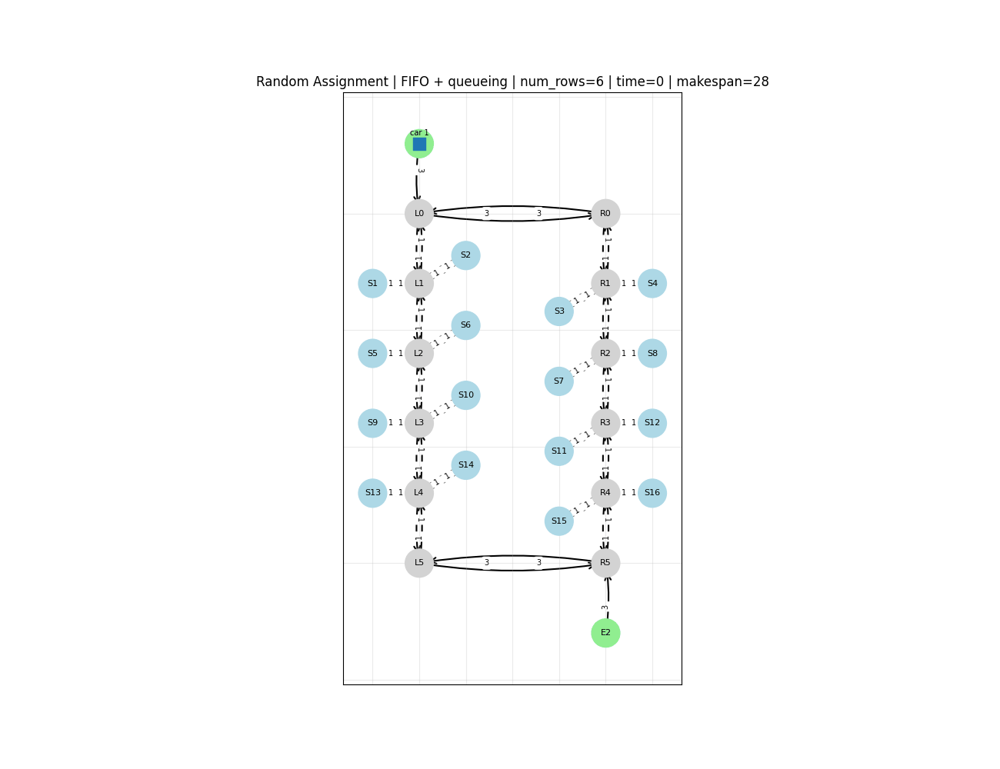

nearest_num_rows_6_queued_fifo_fixed.gif


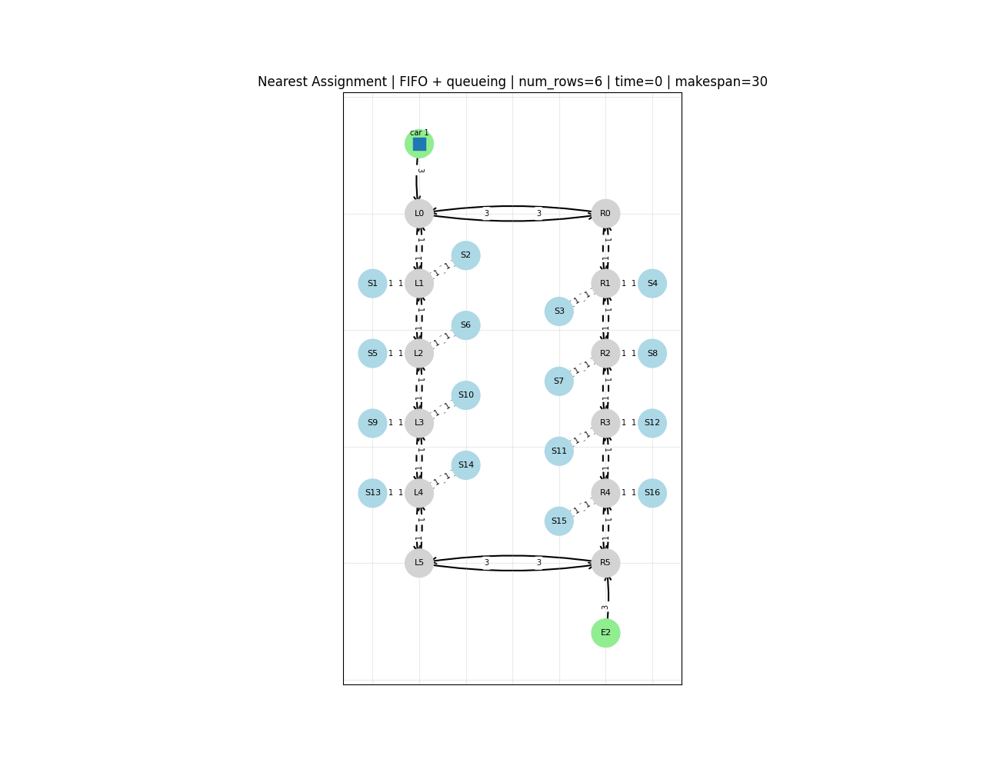

furthest_num_rows_6_queued_fifo_fixed.gif


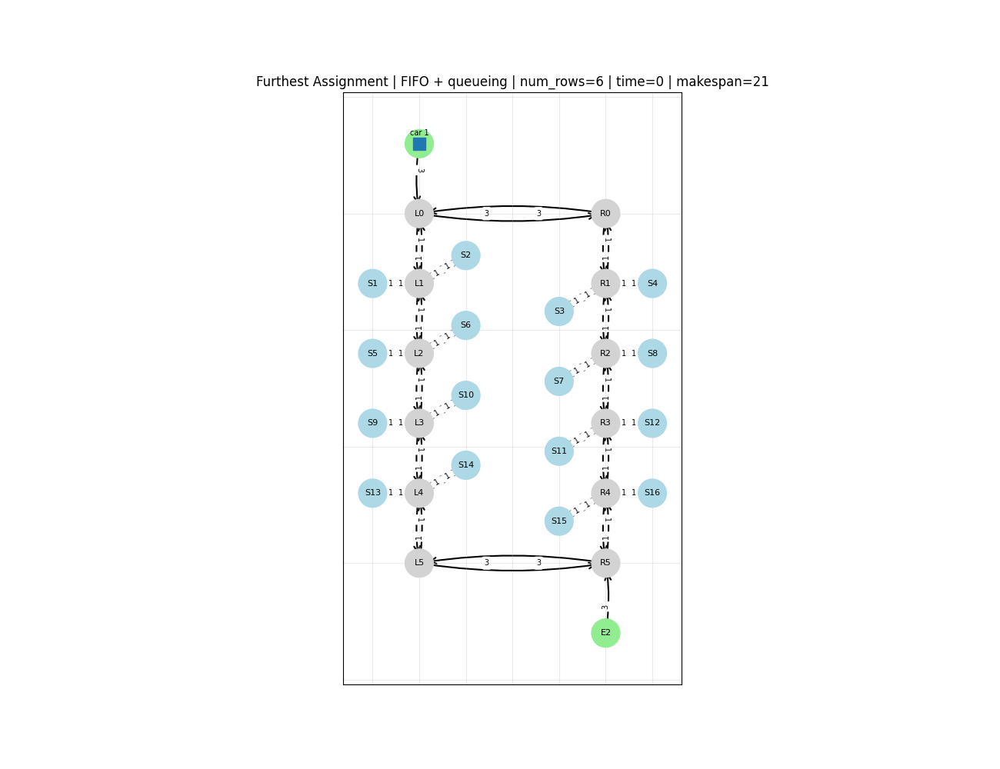

In [10]:
for gif_filename in gif_files:
    print(gif_filename)
    display(Image(filename=gif_filename))


## 8. Save results

In [11]:
animation_results_df.to_csv("assignment_method_animation_results_queued_fifo_fixed.csv", index=False)
animation_results_df


,assignment_method,num_rows,makespan,avg_wait_time,total_wait_time,max_wait_time,instance_time,ip_time,num_vars,num_constraints,time_horizon,status,mip_gap,gif_filename
0,random,6,28,5.000,80.0,13.0,6.030638,5.677,18093,22334,98,OPTIMAL,0.0,random_num_rows_6_queued_fifo_fixed.gif
1,nearest,6,30,5.875,94.0,13.0,5.517091,5.259,15273,18804,95,OPTIMAL,0.0,nearest_num_rows_6_queued_fifo_fixed.gif
2,furthest,6,21,3.000,48.0,7.0,1.710408,1.362,15273,18804,95,OPTIMAL,0.0,furthest_num_rows_6_queued_fifo_fixed.gif
